In [1]:
def detect_text(path):
    """Detects text in the file."""
    from google.cloud import vision
    import io
    os.environ["GOOGLE_APPLICATION_CREDENTIALS"]= "C:/Users/rswfa/Documents/capstone2/Catchinichi-AI/jiho-cred.json"

    client = vision.ImageAnnotatorClient()

    with io.open(path, 'rb') as image_file:
        content = image_file.read()

    image = vision.Image(content=content)

    response = client.text_detection(image=image)
    texts = response.text_annotations
    print('Texts:')

    for text in texts:
        print('\n"{}"'.format(text.description))

        vertices = (['({},{})'.format(vertex.x, vertex.y)
                    for vertex in text.bounding_poly.vertices])

        # print('bounds: {}'.format(','.join(vertices)))

    if response.error.message:
        raise Exception(
            '{}\nFor more info on error messages, check: '
            'https://cloud.google.com/apis/design/errors'.format(
                response.error.message))

In [2]:
import cv2
import os
%matplotlib inline
from matplotlib import pyplot as plt
import matplotlib as mpl

In [6]:
def display_image_in_actual_size(im_path):

    dpi = mpl.rcParams['figure.dpi']
    im_data = plt.imread(im_path)
    height, width, depth = im_data.shape

    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

In [10]:
test_base_dir = "C:/Users/rswfa/Documents/capstone2/Catchinichi-AI/imgs"
testimgs = os.listdir(test_base_dir)
sample_imgs = []
for f in testimgs:
    img_dir = os.path.join(test_base_dir, f)
    sample_imgs.append(img_dir)

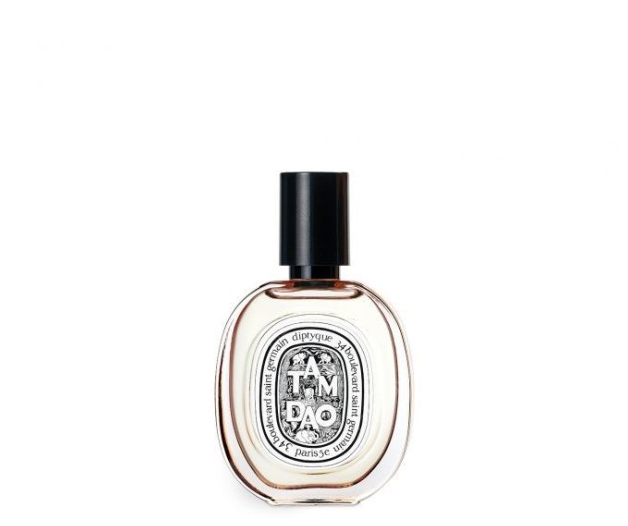

Texts:

"diptyque
TAM
paris se
ermain
saint
Aboulevard
vard saint
"

"diptyque"

"TAM"

"paris"

"se"

"ermain"

"saint"

"Aboulevard"

"vard"

"saint"


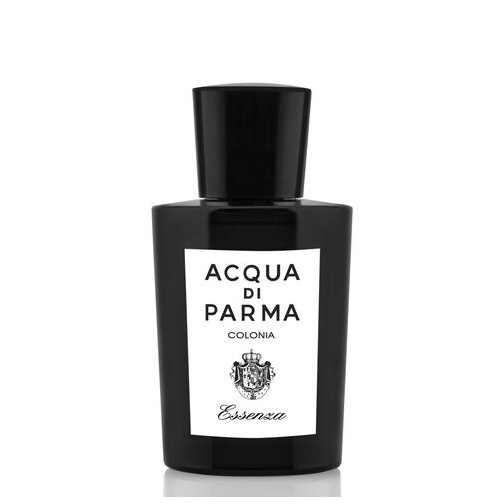

Texts:

"ACQUA
DI
PARMA
COLONIA
Essenza
"

"ACQUA"

"DI"

"PARMA"

"COLONIA"

"Essenza"


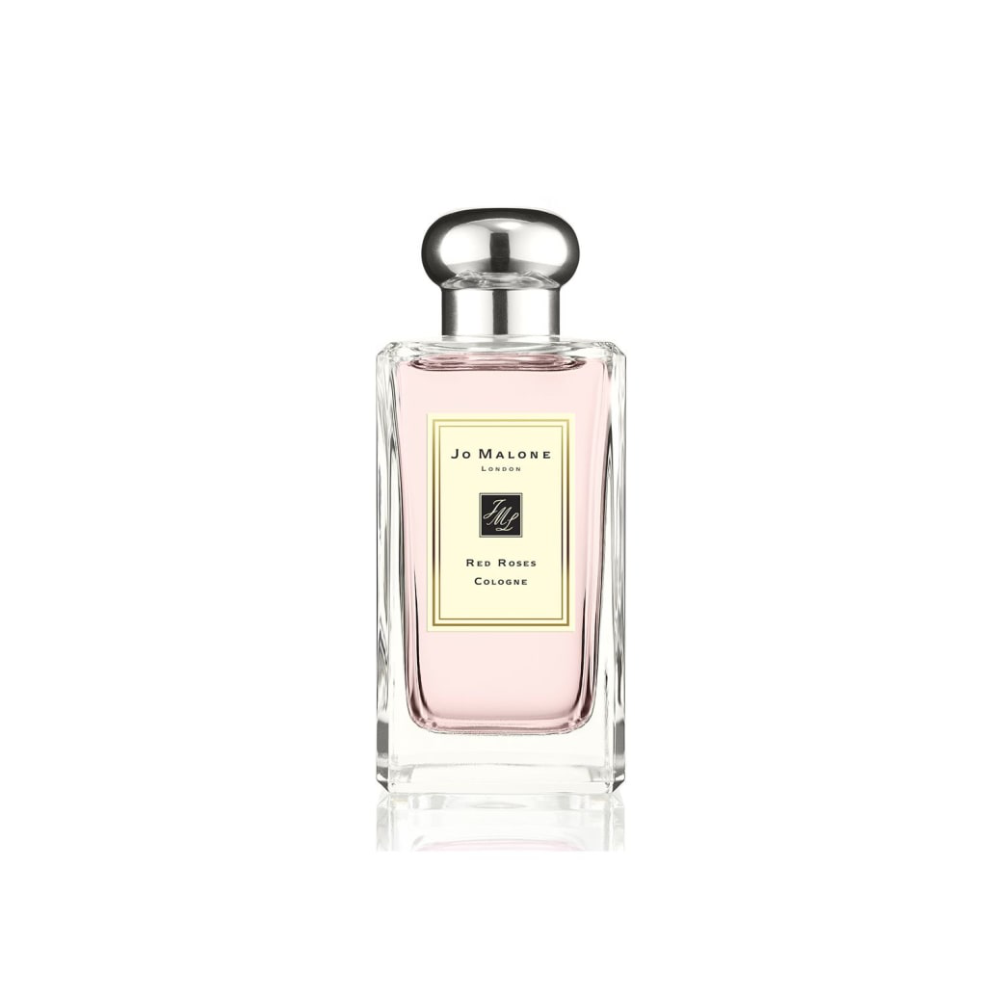

Texts:

"Jo MALONE
LONDON
RED ROSES
COLOGNE
"

"Jo"

"MALONE"

"LONDON"

"RED"

"ROSES"

"COLOGNE"


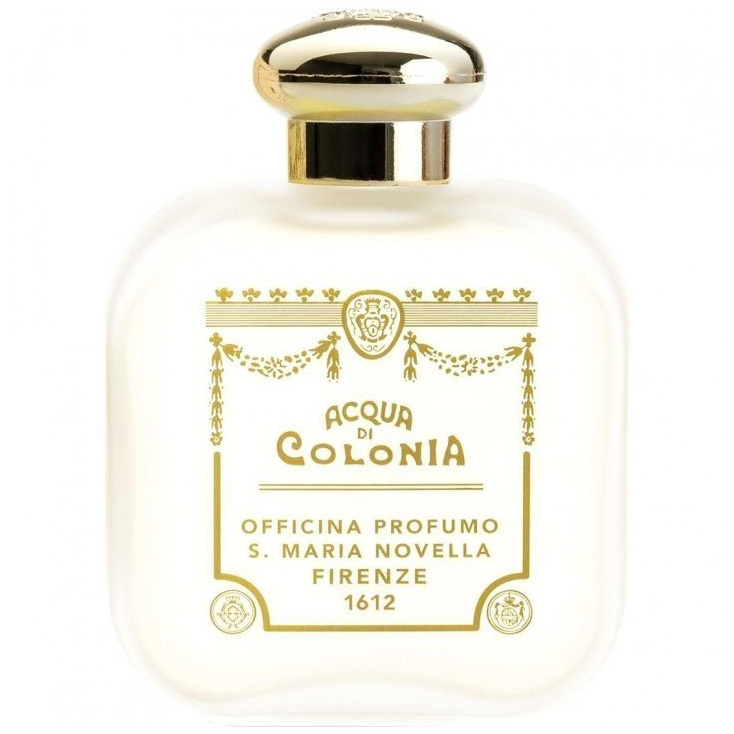

Texts:

"ACQUA
COLONIA
OFFICINA PROFUMO
S. MARIA NOVELLA
FIRENZE
1612
CEED
"

"ACQUA"

"COLONIA"

"OFFICINA"

"PROFUMO"

"S."

"MARIA"

"NOVELLA"

"FIRENZE"

"1612"

"CEED"


In [11]:
for path in sample_imgs:
    display_image_in_actual_size(path)
    detect_text(path)

In [10]:
base_dir = "C:/Users/rswfa/Github/AutoCrawler/download/"
fragrance = os.listdir(base_dir)
first_img = []
length = []
count = 0
for f in fragrance:
    count += 1
    if count % 5 != 0:
        continue

    folder = os.path.join(base_dir, f)
    if os.path.isdir(folder):
        img_dir = os.listdir(folder)[40]
        img_dir = os.path.join(folder, img_dir)
        first_img.append(img_dir)
length.sort(reverse=False)
print(length)

[]


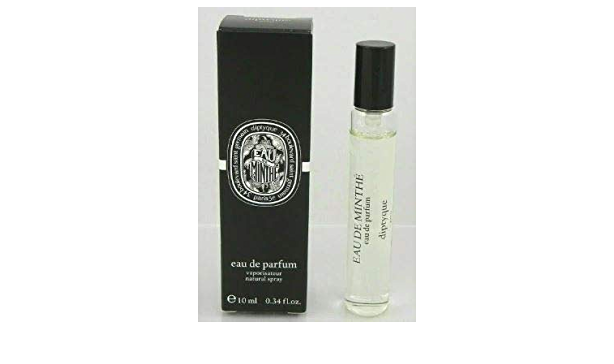

Texts:

"eau de parfum
poiatur
e10 ml 034 Loz.
EAU DE MINTHE
unjund ap aea
"

"eau"

"de"

"parfum"

"poiatur"

"e10"

"ml"

"034"

"Loz."

"EAU"

"DE"

"MINTHE"

"unjund"

"ap"

"aea"


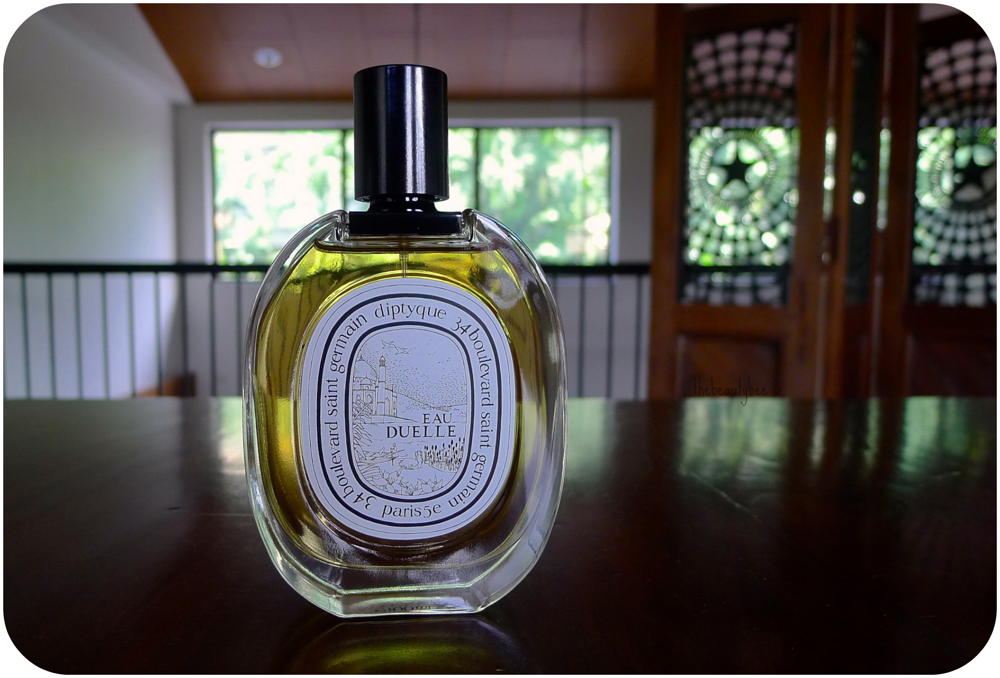

Texts:

"diptyque
EAU
DUELLE
paris 5e
34
34 bo
houlevard saint
germain
main
houlevard saint
"

"diptyque"

"EAU"

"DUELLE"

"paris"

"5e"

"34"

"34"

"bo"

"houlevard"

"saint"

"germain"

"main"

"houlevard"

"saint"


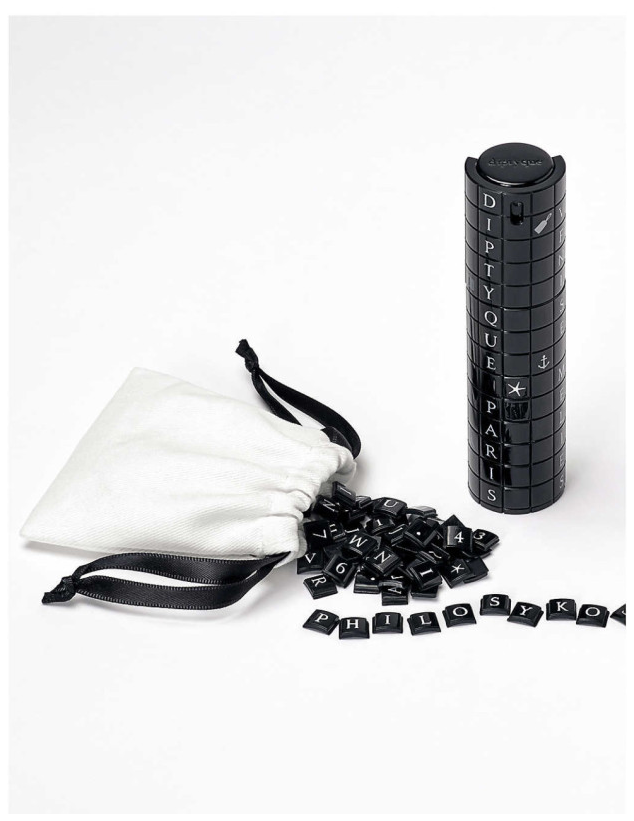

Texts:

"Agn que
P
T.
Y.
W N
R.
Y KO
PARIS
の
"

"Agn"

"que"

"P"

"T."

"Y."

"W"

"N"

"R."

"Y"

"KO"

"PARIS"

"の"


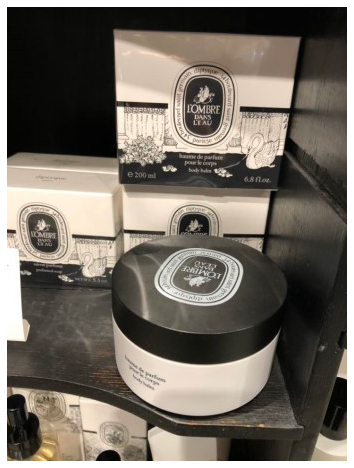

Texts:

"LOMBRE
DANS
LEAU
hase de parfu
ple orp
e 200 ml
OMIRE
LOMIRE
"

"LOMBRE"

"DANS"

"LEAU"

"hase"

"de"

"parfu"

"ple"

"orp"

"e"

"200"

"ml"

"OMIRE"

"LOMIRE"


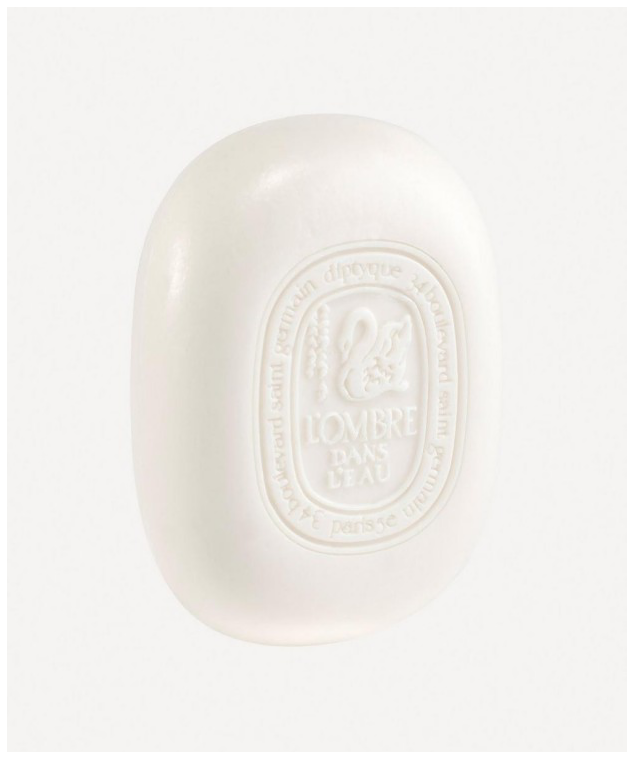

Texts:

"dipoque
LOMBRE
DANS
LEAU
Daris se
4DOulevard saint germain
ADOUEvard saint
"

"dipoque"

"LOMBRE"

"DANS"

"LEAU"

"Daris"

"se"

"4DOulevard"

"saint"

"germain"

"ADOUEvard"

"saint"


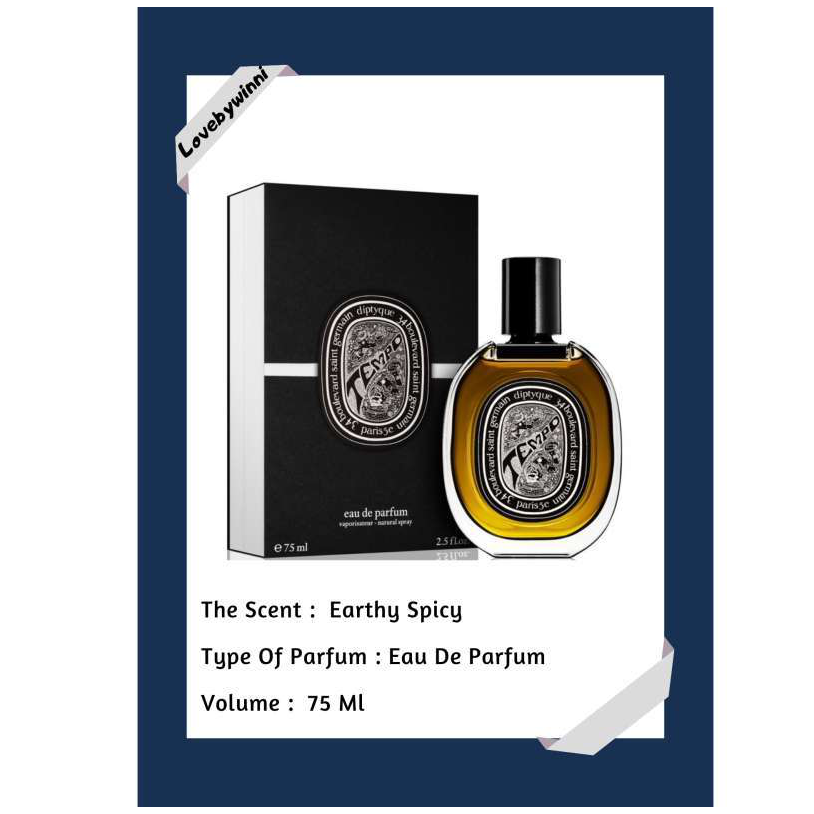

Texts:

"Lovebywinni
diptyque
EMPO
diptyque
Paris se
EMPO
eau de parfum
pariat aral spray
e75 ml
paris se
25flo
The Scent : Earthy Spicy
का
Type Of Parfum : Eau De Parfum
Volume : 75 MI
Oulevard saint
des ard Sant geT
oulevard saint
germ
"

"Lovebywinni"

"diptyque"

"EMPO"

"diptyque"

"Paris"

"se"

"EMPO"

"eau"

"de"

"parfum"

"pariat"

"aral"

"spray"

"e75"

"ml"

"paris"

"se"

"25flo"

"The"

"Scent"

":"

"Earthy"

"Spicy"

"का"

"Type"

"Of"

"Parfum"

":"

"Eau"

"De"

"Parfum"

"Volume"

":"

"75"

"MI"

"Oulevard"

"saint"

"des"

"ard"

"Sant"

"geT"

"oulevard"

"saint"

"germ"


In [14]:
for path in first_img:
    if "Diptyque" in path:
        display_image_in_actual_size(path)
        detect_text(path)
